# 📝1.- Configuracion de l entorno

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [105]:
# Librerías estándar
import os
import random
import datetime
import shutil
from collections import Counter
import re
import glob
import cv2
!pip install opencv-python-headless gradio
import gradio as gr
import tempfile
import mimetypes
from tqdm import tqdm

# Librerías de terceros
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image

# TensorFlow y Keras
import tensorflow as tf
from tensorflow.keras import layers, models, Input, regularizers, initializers
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import (
    Conv2D, BatchNormalization, Activation, MaxPooling2D,
    Add, Dropout, GlobalAveragePooling2D
)
from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, array_to_img
from tensorflow.keras.callbacks import (
    EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
)
from tensorflow.keras.optimizers import SGD

# Scikit-learn
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight


# Extensión de TensorBoard
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


# 📊2.- Cargamiento y exploracion de los datos

In [3]:
# Ruta en Drive
ruta_drive_train = "/content/drive/MyDrive/Deep learning/Datasets/simpsons_dataset"
ruta_drive_test = "/content/drive/MyDrive/Deep learning/Datasets/kaggle_simpson_testset"


# Nueva ruta en disco local
ruta_train = "/content/simpsons_dataset"
ruta_test = "/content/kaggle_simpson_testset"

# Copiar datasets al almacenamiento local del entorno de Colab
shutil.copytree(ruta_drive_train, ruta_train, dirs_exist_ok=True)
shutil.copytree(ruta_drive_test, ruta_test, dirs_exist_ok=True)


'/content/kaggle_simpson_testset'

## 🏋️Entrenamiento

In [4]:
# Conteo de las carpetas del dataset de entrenamiento
os.listdir(ruta_train)

['moe_szyslak',
 'otto_mann',
 'disco_stu',
 'principal_skinner',
 'kent_brockman',
 'professor_john_frink',
 'sideshow_bob',
 'patty_bouvier',
 'charles_montgomery_burns',
 'nelson_muntz',
 'waylon_smithers',
 'ralph_wiggum',
 'groundskeeper_willie',
 'miss_hoover',
 'homer_simpson',
 'gil',
 'rainier_wolfcastle',
 'maggie_simpson',
 'fat_tony',
 'carl_carlson',
 'agnes_skinner',
 'martin_prince',
 'milhouse_van_houten',
 'mayor_quimby',
 'edna_krabappel',
 'bart_simpson',
 'cletus_spuckler',
 'ned_flanders',
 'chief_wiggum',
 'apu_nahasapeemapetilon',
 'comic_book_guy',
 'snake_jailbird',
 'marge_simpson',
 'barney_gumble',
 'krusty_the_clown',
 'sideshow_mel',
 'lenny_leonard',
 'troy_mcclure',
 'lisa_simpson',
 'lionel_hutz',
 'selma_bouvier',
 'abraham_grampa_simpson']

In [5]:
# Obtener nombres de las carpetas (clases)
clases = os.listdir(ruta_train)
clases = [clase for clase in clases if os.path.isdir(os.path.join(ruta_train, clase))]

In [6]:
# Contar imágenes por clase
conteo_clases = {}
for clase in clases:
    ruta_clase = os.path.join(ruta_train, clase)
    conteo_clases[clase] = len(os.listdir(ruta_clase))

In [7]:
# Mostrar conteo
for i, (clase, cantidad) in enumerate(sorted(conteo_clases.items(), key=lambda x: x[1], reverse=True), start=1):
    print(f"{i}. {clase}: {cantidad} imágenes")

1. homer_simpson: 2246 imágenes
2. ned_flanders: 1454 imágenes
3. moe_szyslak: 1452 imágenes
4. lisa_simpson: 1354 imágenes
5. bart_simpson: 1342 imágenes
6. marge_simpson: 1291 imágenes
7. krusty_the_clown: 1206 imágenes
8. principal_skinner: 1194 imágenes
9. charles_montgomery_burns: 1193 imágenes
10. milhouse_van_houten: 1079 imágenes
11. chief_wiggum: 986 imágenes
12. abraham_grampa_simpson: 913 imágenes
13. sideshow_bob: 877 imágenes
14. apu_nahasapeemapetilon: 623 imágenes
15. kent_brockman: 498 imágenes
16. comic_book_guy: 469 imágenes
17. edna_krabappel: 457 imágenes
18. nelson_muntz: 358 imágenes
19. lenny_leonard: 310 imágenes
20. mayor_quimby: 246 imágenes
21. waylon_smithers: 181 imágenes
22. maggie_simpson: 128 imágenes
23. groundskeeper_willie: 121 imágenes
24. barney_gumble: 106 imágenes
25. selma_bouvier: 103 imágenes
26. carl_carlson: 98 imágenes
27. ralph_wiggum: 89 imágenes
28. patty_bouvier: 72 imágenes
29. martin_prince: 71 imágenes
30. professor_john_frink: 65 imá

In [8]:
print(f"Total de clases (personajes): {len(conteo_clases)}")
print(f"Total de imágenes en entrenamiento: {sum(conteo_clases.values())}")

Total de clases (personajes): 42
Total de imágenes en entrenamiento: 20933


In [9]:
cantidades = list(conteo_clases.values())
print(f"Promedio de imágenes por clase: {np.mean(cantidades):.2f}")
print(f"Clase con más imágenes: {max(cantidades)}")
print(f"Clase con menos imágenes: {min(cantidades)}")

Promedio de imágenes por clase: 498.40
Clase con más imágenes: 2246
Clase con menos imágenes: 3


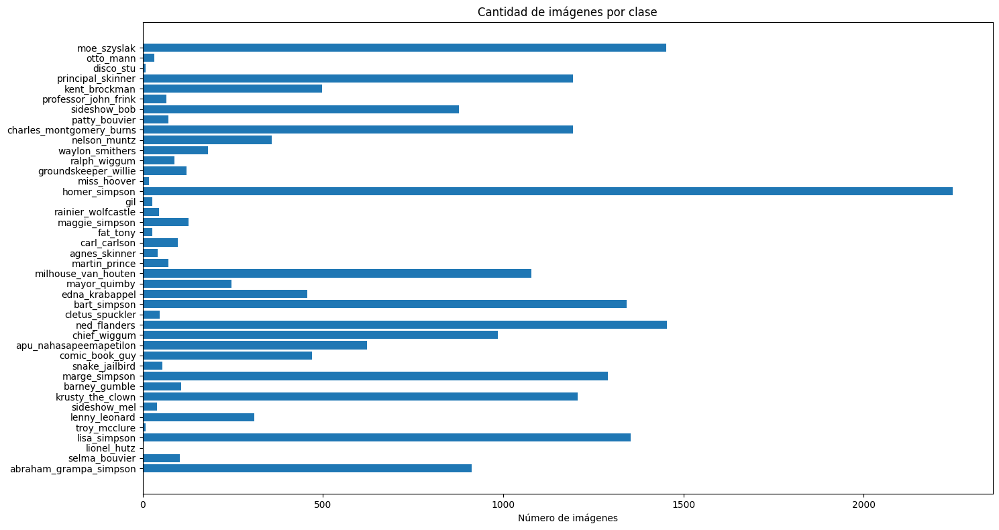

In [10]:
# Visualizar en gráfico de barras
plt.figure(figsize=(15, 8))
plt.barh(list(conteo_clases.keys()), list(conteo_clases.values()))
plt.xlabel('Número de imágenes')
plt.title('Cantidad de imágenes por clase')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


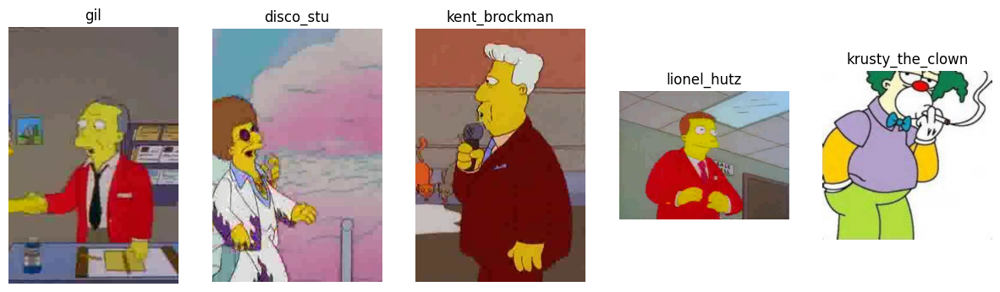

In [11]:
def mostrar_ejemplos(ruta_base, clases, n=5):
    seleccionadas = random.sample(clases, n)
    plt.figure(figsize=(15, 5))
    for i, clase in enumerate(seleccionadas):
        ruta_clase = os.path.join(ruta_base, clase)
        imagen = random.choice(os.listdir(ruta_clase))
        ruta_img = os.path.join(ruta_clase, imagen)
        img = Image.open(ruta_img)
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.title(clase)
        plt.axis('off')
    plt.show()

mostrar_ejemplos(ruta_train, clases)

## 🧪Pruebas

In [12]:
# Obtener todos los archivos .jpg (ignorando archivos ocultos)
archivos = sorted([
    f for f in os.listdir(ruta_test)
    if f.lower().endswith('.jpg') and not f.startswith('.')
])

# Verificar si los nombres siguen el patrón y extraer etiquetas
etiquetas = []
archivos_validos = []

for nombre in archivos:
    match = re.match(r'^(.+)_\d+\.jpg$', nombre)
    if match:
        etiquetas.append(match.group(1))  # nombre del personaje
        archivos_validos.append(nombre)
    else:
        print(f"⚠️ Archivo ignorado por nombre no válido: {nombre}")

# Contar imágenes por personaje
conteo = Counter(etiquetas)

# Mostrar estadísticas generales
print(f"\n✅ Total de imágenes válidas: {len(archivos_validos)}")
print(f"✅ Total de personajes únicos: {len(conteo)}")

# Mostrar todos los personajes con su número de imágenes (orden alfabético)
print("\n📋 Cantidad de imágenes por personaje:")
for personaje in sorted(conteo.keys()):
    print(f"{personaje}: {conteo[personaje]}")


✅ Total de imágenes válidas: 990
✅ Total de personajes únicos: 20

📋 Cantidad de imágenes por personaje:
abraham_grampa_simpson: 48
apu_nahasapeemapetilon: 50
bart_simpson: 50
charles_montgomery_burns: 48
chief_wiggum: 50
comic_book_guy: 49
edna_krabappel: 50
homer_simpson: 50
kent_brockman: 50
krusty_the_clown: 50
lenny_leonard: 50
lisa_simpson: 50
marge_simpson: 50
mayor_quimby: 50
milhouse_van_houten: 49
moe_szyslak: 50
ned_flanders: 49
nelson_muntz: 50
principal_skinner: 50
sideshow_bob: 47


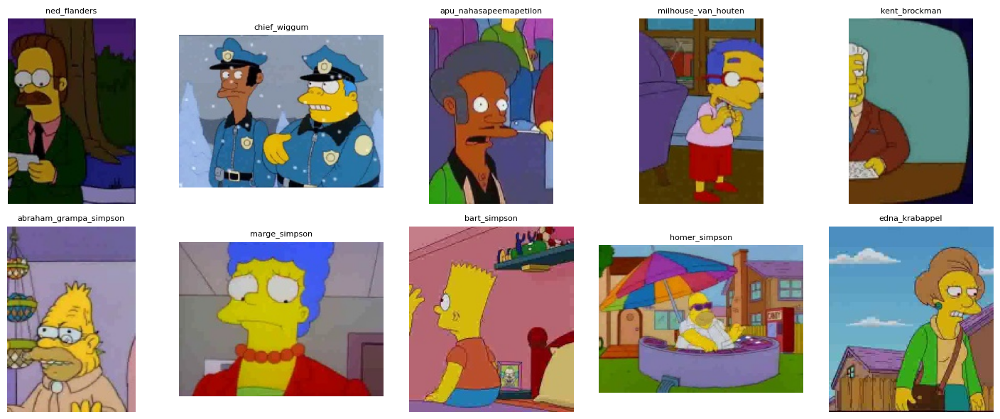

In [13]:
#Mostrar 1 imagen aleatoria por personaje
muestras_unicas = {}
for archivo in archivos:
    etiqueta = re.match(r'^(.+)_\d+\.jpg$', archivo)
    if etiqueta:
        personaje = etiqueta.group(1)
        if personaje not in muestras_unicas:
            muestras_unicas[personaje] = archivo

# Mostrar hasta 10 personajes con una imagen cada uno
muestras_a_mostrar = dict(random.sample(list(muestras_unicas.items()), 10))

plt.figure(figsize=(15, 6))
for i, (personaje, archivo) in enumerate(muestras_a_mostrar.items()):
    img = Image.open(os.path.join(ruta_test, archivo))
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(personaje, fontsize=8)
    plt.axis('off')
plt.tight_layout()
plt.show()

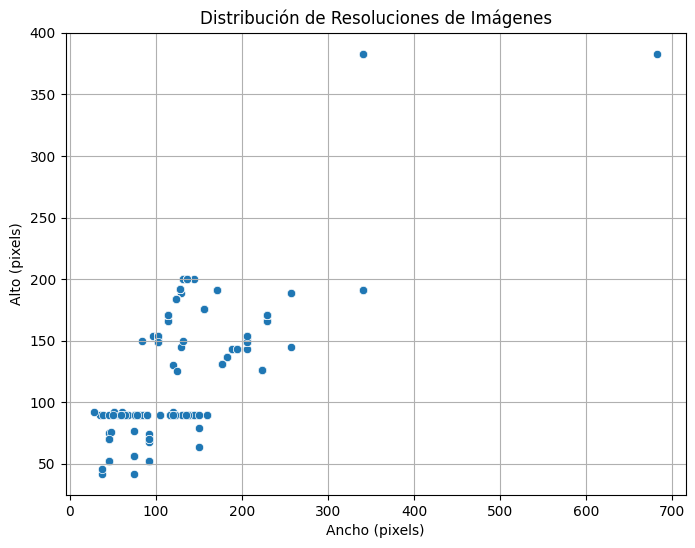

In [14]:
# Medir ancho y alto de cada imagen
dimensiones = []

for archivo in archivos:
    ruta_img = os.path.join(ruta_test, archivo)
    try:
        with Image.open(ruta_img) as img:
            dimensiones.append(img.size)  # (ancho, alto)
    except Exception as e:
        print(f"Error al leer {archivo}: {e}")

# Convertir a numpy array
dimensiones = np.array(dimensiones)
anchos = dimensiones[:, 0]
altos = dimensiones[:, 1]

# Gráfica de dispersión ancho vs alto
plt.figure(figsize=(8, 6))
sns.scatterplot(x=anchos, y=altos)
plt.title("Distribución de Resoluciones de Imágenes")
plt.xlabel("Ancho (pixels)")
plt.ylabel("Alto (pixels)")
plt.grid(True)
plt.show()

# ⚙️3.- Procesamiento de los datos

In [42]:
# 📦 Parámetros globales
IMG_SIZE = (128, 128)
BATCH_SIZE = 32
#CANTIDAD_DESEADA = 1000  # Máximo de imágenes por clase (post-augmentación)
TOP_N = 18  # Seleccionar las 18 clases más representadas

In [43]:
# 📊 Función para obtener las top-N clases con más imágenes
def obtener_top_clases(ruta, top_n=18):
    conteo_clases = {}
    for clase in os.listdir(ruta):
        ruta_clase = os.path.join(ruta, clase)
        if os.path.isdir(ruta_clase):
            n_imgs = len([
                f for f in os.listdir(ruta_clase)
                if f.lower().endswith('.jpg') and not f.startswith('.')
            ])
            conteo_clases[clase] = n_imgs
    top_clases = sorted(conteo_clases, key=lambda c: conteo_clases[c], reverse=True)[:top_n]
    return top_clases, conteo_clases

# Obtener top 18 clases
top_18_clases, conteo_clases = obtener_top_clases(ruta_train, top_n=TOP_N)

# Mostrar resultado
print("📋 Top 18 personajes con más imágenes:")
for i, clase in enumerate(top_18_clases, start=1):
    print(f"{i}. {clase}: {conteo_clases[clase]} imágenes")

📋 Top 18 personajes con más imágenes:
1. homer_simpson: 2246 imágenes
2. ned_flanders: 1454 imágenes
3. moe_szyslak: 1452 imágenes
4. lisa_simpson: 1354 imágenes
5. bart_simpson: 1342 imágenes
6. marge_simpson: 1291 imágenes
7. krusty_the_clown: 1206 imágenes
8. principal_skinner: 1194 imágenes
9. charles_montgomery_burns: 1193 imágenes
10. milhouse_van_houten: 1079 imágenes
11. chief_wiggum: 986 imágenes
12. abraham_grampa_simpson: 913 imágenes
13. sideshow_bob: 877 imágenes
14. apu_nahasapeemapetilon: 623 imágenes
15. kent_brockman: 498 imágenes
16. comic_book_guy: 469 imágenes
17. edna_krabappel: 457 imágenes
18. nelson_muntz: 358 imágenes


In [44]:
# 🧪 Preparar test set
archivos = sorted([
    f for f in os.listdir(ruta_test)
    if f.lower().endswith('.jpg') and not f.startswith('.')
])

etiquetas = []
archivos_validos = []

for nombre in archivos:
    match = re.match(r'^(.+)_\d+\.jpg$', nombre)
    if match:
        etiquetas.append(match.group(1))
        archivos_validos.append(nombre)

df_test = pd.DataFrame({
    'filename': archivos_validos,
    'class': etiquetas
})

# Filtrar solo las top 18 clases
df_test = df_test[df_test['class'].isin(top_18_clases)].reset_index(drop=True)

In [45]:
# Generador para test
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=df_test,
    directory=ruta_test,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    classes=top_18_clases
)

Found 890 validated image filenames belonging to 18 classes.


In [46]:
# 📁 Obtener rutas y etiquetas de imágenes de las top 18 clases directamente desde ruta_train

data_paths = []
class_labels = []

for clase in top_18_clases:
    ruta_clase = os.path.join(ruta_train, clase)
    archivos = glob.glob(os.path.join(ruta_clase, '*.jpg'))
    data_paths.extend(archivos)
    class_labels.extend([clase] * len(archivos))

# 🧾 Crear el DataFrame
df_all = pd.DataFrame({
    'filename': data_paths,
    'class': class_labels
})

# 🧪 Separar en entrenamiento y validación (estratificado)
df_train, df_val = train_test_split(
    df_all,
    test_size=0.2,
    stratify=df_all['class'],
    random_state=42
)

# ✅ Mostrar conteo por clase
print("\n📊 Cantidad de imágenes por clase (entrenamiento):")
print(df_train['class'].value_counts())

print("\n📊 Cantidad de imágenes por clase (validación):")
print(df_val['class'].value_counts())


📊 Cantidad de imágenes por clase (entrenamiento):
class
homer_simpson               1797
ned_flanders                1163
moe_szyslak                 1162
lisa_simpson                1083
bart_simpson                1074
marge_simpson               1033
krusty_the_clown             965
principal_skinner            955
charles_montgomery_burns     954
milhouse_van_houten          863
chief_wiggum                 789
abraham_grampa_simpson       730
sideshow_bob                 702
apu_nahasapeemapetilon       498
kent_brockman                398
comic_book_guy               375
edna_krabappel               366
nelson_muntz                 286
Name: count, dtype: int64

📊 Cantidad de imágenes por clase (validación):
class
homer_simpson               449
ned_flanders                291
moe_szyslak                 290
lisa_simpson                271
bart_simpson                268
marge_simpson               258
krusty_the_clown            241
principal_skinner           239
charles_montg

In [47]:
# ⚙️ Crear generadores
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=25,
    zoom_range=0.3,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.5, 1.5],
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# ⚠️ Ajustar estadísticas del generador si se usa normalización featurewise
X_sample = np.array([
    img_to_array(load_img(p, target_size=IMG_SIZE))
    for p in df_train['filename'][:100]  # limitar por memoria
])
train_datagen.fit(X_sample)

val_datagen = ImageDataGenerator(rescale=1./255)  # 👈 sin augmentación para validación

In [48]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    classes=top_18_clases
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    classes=top_18_clases
)

Found 15193 validated image filenames belonging to 18 classes.
Found 3799 validated image filenames belonging to 18 classes.


In [49]:
# 📈 Verificar balance final
conteo_balanceado = Counter(df_train['class'])

print("\n📊 Cantidad de imágenes por clase (entrenamiento - sin balancear artificialmente):")
for clase in top_18_clases:
    print(f"{clase}: {conteo_balanceado[clase]} imágenes")


📊 Cantidad de imágenes por clase (entrenamiento - sin balancear artificialmente):
homer_simpson: 1797 imágenes
ned_flanders: 1163 imágenes
moe_szyslak: 1162 imágenes
lisa_simpson: 1083 imágenes
bart_simpson: 1074 imágenes
marge_simpson: 1033 imágenes
krusty_the_clown: 965 imágenes
principal_skinner: 955 imágenes
charles_montgomery_burns: 954 imágenes
milhouse_van_houten: 863 imágenes
chief_wiggum: 789 imágenes
abraham_grampa_simpson: 730 imágenes
sideshow_bob: 702 imágenes
apu_nahasapeemapetilon: 498 imágenes
kent_brockman: 398 imágenes
comic_book_guy: 375 imágenes
edna_krabappel: 366 imágenes
nelson_muntz: 286 imágenes


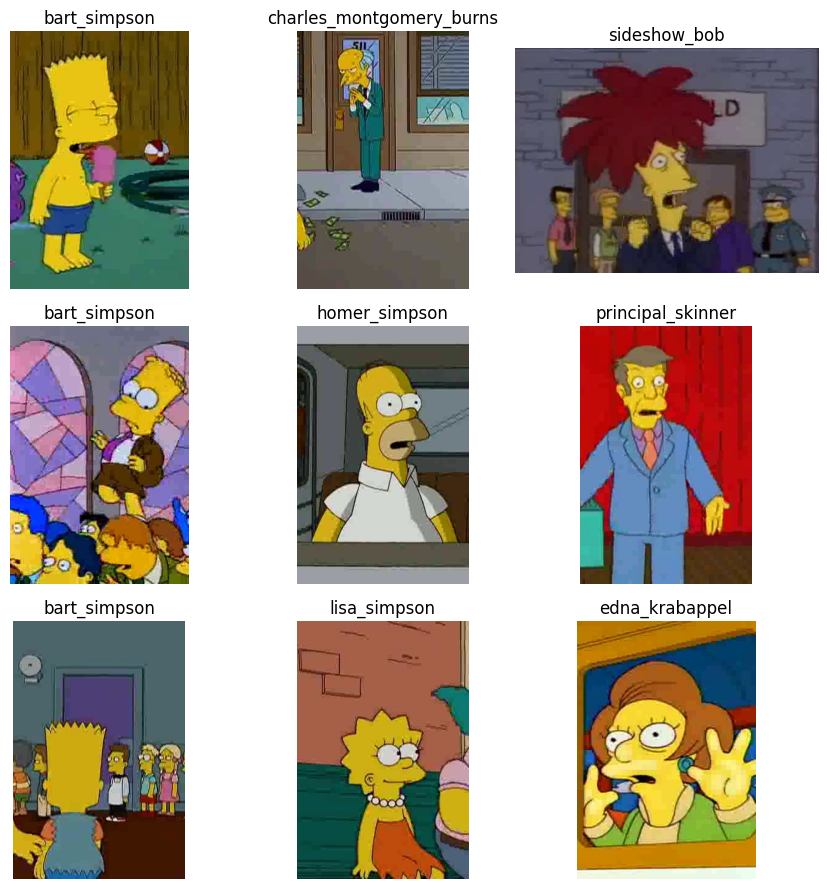

In [50]:
sample = df_train.sample(9)
fig, axes = plt.subplots(3, 3, figsize=(9, 9))

for img_path, label, ax in zip(sample['filename'], sample['class'], axes.flatten()):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
plt.show()

# ⚗️4.- Modelamiento

In [84]:
def residual_block(x, filters, stride=1, l2_lambda=1e-4):
    shortcut = x

    # Primera convolución
    x = layers.Conv2D(filters, kernel_size=3, strides=stride, padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda))(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    # Segunda convolución
    x = layers.Conv2D(filters, kernel_size=3, strides=1, padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda))(x)
    x = layers.BatchNormalization()(x)

    # Shortcut si cambia el tamaño o número de filtros
    if stride != 1 or shortcut.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, kernel_size=1, strides=stride, padding='same',
                                 kernel_regularizer=regularizers.l2(l2_lambda))(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)

    # Suma residual + activación + dropout
    x = layers.add([x, shortcut])
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    return x

In [85]:
def build_resnet(input_shape=(128, 128, 3), num_classes=18, l2_lambda=1e-4):
    inputs = Input(shape=input_shape, name="Input")

    # Capa inicial
    x = layers.Conv2D(64, kernel_size=7, strides=2, padding='same',
                      kernel_regularizer=regularizers.l2(l2_lambda), name="ConvInicial")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.MaxPooling2D(pool_size=3, strides=2, padding='same')(x)

    # Bloques residuales
    x = residual_block(x, filters=64, stride=1, l2_lambda=l2_lambda)
    x = residual_block(x, filters=64, stride=1, l2_lambda=l2_lambda)

    x = residual_block(x, filters=128, stride=2, l2_lambda=l2_lambda)
    x = residual_block(x, filters=128, stride=1, l2_lambda=l2_lambda)

    x = residual_block(x, filters=256, stride=2, l2_lambda=l2_lambda)
    x = residual_block(x, filters=256, stride=1, l2_lambda=l2_lambda)

    # Global Average Pooling + capa final
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(512, kernel_regularizer=regularizers.l2(l2_lambda))(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.5)(x)

    outputs = layers.Dense(num_classes, activation='softmax',
                           kernel_regularizer=regularizers.l2(l2_lambda),
                           name="Output")(x)

    model = models.Model(inputs, outputs, name="ResNet_Mejorada_v3")
    return model

In [86]:
# Crear modelo
model = build_resnet(input_shape=(128, 128, 3), num_classes=18)

# Ver arquitectura
model.summary()

Model: "ResNet_Mejorada_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input (InputLayer)  │ (None, 128, 128,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ConvInicial         │ (None, 64, 64,    │      9,472 │ Input[0][0]       │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ ConvInicial[0][0] │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_74      │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 32, 32,    │          0 │ leaky_re_lu_74[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_77 (Conv2D)  │ (None, 32, 32,    │     36,928 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_77[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_75      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_78 (Conv2D)  │ (None, 32, 32,    │     36,928 │ leaky_re_lu_75[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_78[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_33 (Add)        │ (None, 32, 32,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ max_pooling2d_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_76      │ (None, 32, 32,    │          0 │ add_33[0][0]      │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_37          │ (None, 32, 32,    │          0 │ leaky_re_lu_76[0… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_79 (Conv2D)  │ (None, 32, 32,    │     36,928 │ dropout_37[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ conv2d_79[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_77      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_80 (Conv2D)  │ (None, 32, 32,    │     36,928 │ leaky_re_lu_77[0

 Total params: 2,932,370 (11.19 MB)

 Trainable params: 2,926,866 (11.17 MB)

 Non-trainable params: 5,504 (21.50 KB)

# 🦾5.- Entrenamiento

In [87]:
# Definimos el optimizador SGD con Nesterov
optimizador = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)

# Compilamos el modelo con pérdida y métrica de precisión
model.compile(
    optimizer=optimizador,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [88]:
class EpochSaver(tf.keras.callbacks.Callback):
    """
    Guarda en un archivo la última época completada, útil para reanudar entrenamientos.
    """
    def __init__(self, path):
        super().__init__()
        self.path = path

    def on_epoch_end(self, epoch, logs=None):
        with open(self.path, 'w') as f:
            f.write(str(epoch + 1))  # Guarda la próxima época

In [89]:
# Definir rutas base para guardar checkpoints y logs
checkpoint_dir = "/content/drive/MyDrive/Deep learning/Checkpoints"
log_base_dir = "/content/drive/MyDrive/Deep learning/Logs"

# Rutas fijas
epoch_file_path = os.path.join(checkpoint_dir, "ultima_epoca.txt")
checkpoint_path = os.path.join(checkpoint_dir, "mejor_modelo_resnet.h5")
log_dir = os.path.join(log_base_dir, "resnet_logs")  # Logs de TensorBoard

# Crear callback personalizado para guardar la época
epoch_saver = EpochSaver(epoch_file_path)

In [90]:
# Detiene el entrenamiento si el modelo deja de mejorar
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Guarda el mejor modelo basado en la precisión de validación
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

# Reduce la tasa de aprendizaje si la pérdida no mejora
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    min_lr=1e-6,
    verbose=1
)

# Guarda métricas para visualización en TensorBoard
tensorboard = TensorBoard(
    log_dir=log_dir,
    histogram_freq=1
)

# Lista completa de callbacks
callbacks = [
    early_stopping,
    model_checkpoint,
    reduce_lr,
    tensorboard,
    epoch_saver
]

In [91]:
# Obtener las clases del generador
class_indices = train_generator.class_indices
classes = list(class_indices.keys())  # nombres de clases

# Obtener etiquetas verdaderas desde el generador
y_train = train_generator.classes  # array de etiquetas numéricas (0, 1, ..., 17)

# Calcular los pesos balanceados
pesos = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

# Crear el diccionario class_weight
class_weight = dict(zip(np.unique(y_train), pesos))

In [92]:
# Entrenamos el modelo con los generadores de datos
historia = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=50,
    callbacks=callbacks,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weight,
    verbose=1
)
# Verificamos si se usaron todas las épocas o se detuvo por EarlyStopping
epocas_planificadas = historia.params['epochs']
epocas_ejecutadas = len(historia.history['loss'])

if epocas_ejecutadas < epocas_planificadas:
    print(f"⚠️ Entrenamiento detenido anticipadamente por EarlyStopping en la época {epocas_ejecutadas}.")
else:
    print("✅ Entrenamiento completado hasta la última época.")

Epoch 1/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.0825 - loss: 3.6845
Epoch 1: val_accuracy improved from -inf to 0.12421, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 130s 241ms/step - accuracy: 0.0826 - loss: 3.6843 - val_accuracy: 0.1242 - val_loss: 3.0676 - learning_rate: 0.0100
Epoch 2/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.1250 - loss: 3.0782

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 2: val_accuracy improved from 0.12421 to 0.12632, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.1250 - loss: 3.0782 - val_accuracy: 0.1263 - val_loss: 3.1208 - learning_rate: 0.0100
Epoch 3/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.1632 - loss: 3.1149
Epoch 3: val_accuracy did not improve from 0.12632

Epoch 3: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
474/474 ━━━━━━━━━━━━━━━━━━━━ 140s 296ms/step - accuracy: 0.1632 - loss: 3.1147 - val_accuracy: 0.0975 - val_loss: 4.8850 - learning_rate: 0.0100
Epoch 4/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.3438 - loss: 2.3742
Epoch 4: val_accuracy did not improve from 0.12632
474/474 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.3438 - loss: 2.3742 - val_accuracy: 0.0906 - val_loss: 4.9284 - learning_rate: 0.0050
Epoch 5/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.2639 - loss: 2.5771
Epoch 5: val_accuracy improved from 0.12632 to 0.35090, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_mo

474/474 ━━━━━━━━━━━━━━━━━━━━ 105s 222ms/step - accuracy: 0.2640 - loss: 2.5770 - val_accuracy: 0.3509 - val_loss: 2.2897 - learning_rate: 0.0050
Epoch 6/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.3438 - loss: 2.1976
Epoch 6: val_accuracy improved from 0.35090 to 0.36838, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.3438 - loss: 2.1976 - val_accuracy: 0.3684 - val_loss: 2.2245 - learning_rate: 0.0050
Epoch 7/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.3349 - loss: 2.3383
Epoch 7: val_accuracy did not improve from 0.36838
474/474 ━━━━━━━━━━━━━━━━━━━━ 107s 225ms/step - accuracy: 0.3349 - loss: 2.3382 - val_accuracy: 0.3565 - val_loss: 2.3822 - learning_rate: 0.0050
Epoch 8/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.5625 - loss: 1.6778
Epoch 8: val_accuracy did not improve from 0.36838

Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0024999999441206455.
474/474 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5625 - loss: 1.6778 - val_accuracy: 0.3371 - val_loss: 2.5146 - learning_rate: 0.0050
Epoch 9/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.4116 - loss: 2.0636
Epoch 9: val_accuracy improved from 0.36838 to 0.50000, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_m

474/474 ━━━━━━━━━━━━━━━━━━━━ 144s 303ms/step - accuracy: 0.4117 - loss: 2.0634 - val_accuracy: 0.5000 - val_loss: 1.8869 - learning_rate: 0.0025
Epoch 10/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.4688 - loss: 1.7630
Epoch 10: val_accuracy improved from 0.50000 to 0.50768, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.4688 - loss: 1.7630 - val_accuracy: 0.5077 - val_loss: 1.8361 - learning_rate: 0.0025
Epoch 11/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.4659 - loss: 1.8573
Epoch 11: val_accuracy improved from 0.50768 to 0.59031, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 202s 321ms/step - accuracy: 0.4659 - loss: 1.8572 - val_accuracy: 0.5903 - val_loss: 1.5429 - learning_rate: 0.0025
Epoch 12/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step - accuracy: 0.5938 - loss: 1.4142
Epoch 12: val_accuracy improved from 0.59031 to 0.59534, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5938 - loss: 1.4142 - val_accuracy: 0.5953 - val_loss: 1.5187 - learning_rate: 0.0025
Epoch 13/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.4952 - loss: 1.7508
Epoch 13: val_accuracy did not improve from 0.59534
474/474 ━━━━━━━━━━━━━━━━━━━━ 202s 340ms/step - accuracy: 0.4952 - loss: 1.7508 - val_accuracy: 0.4401 - val_loss: 2.0683 - learning_rate: 0.0025
Epoch 14/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.5000 - loss: 1.6831
Epoch 14: val_accuracy did not improve from 0.59534

Epoch 14: ReduceLROnPlateau reducing learning rate to 0.0012499999720603228.
474/474 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.5000 - loss: 1.6831 - val_accuracy: 0.4415 - val_loss: 2.0642 - learning_rate: 0.0025
Epoch 15/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.5405 - loss: 1.6270
Epoch 15: val_accuracy improved from 0.59534 to 0.62182, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/

474/474 ━━━━━━━━━━━━━━━━━━━━ 142s 229ms/step - accuracy: 0.5406 - loss: 1.6270 - val_accuracy: 0.6218 - val_loss: 1.4059 - learning_rate: 0.0012
Epoch 16/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step - accuracy: 0.5938 - loss: 1.4272
Epoch 16: val_accuracy did not improve from 0.62182
474/474 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.5938 - loss: 1.4272 - val_accuracy: 0.6091 - val_loss: 1.4512 - learning_rate: 0.0012
Epoch 17/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.5760 - loss: 1.5245
Epoch 17: val_accuracy improved from 0.62182 to 0.62765, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5



Epoch 17: ReduceLROnPlateau reducing learning rate to 0.0006249999860301614.
474/474 ━━━━━━━━━━━━━━━━━━━━ 143s 247ms/step - accuracy: 0.5760 - loss: 1.5245 - val_accuracy: 0.6276 - val_loss: 1.4963 - learning_rate: 0.0012
Epoch 18/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - accuracy: 0.5625 - loss: 1.5114
Epoch 18: val_accuracy did not improve from 0.62765
474/474 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5625 - loss: 1.5114 - val_accuracy: 0.6202 - val_loss: 1.5396 - learning_rate: 6.2500e-04
Epoch 19/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.6019 - loss: 1.4444
Epoch 19: val_accuracy improved from 0.62765 to 0.72219, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 143s 263ms/step - accuracy: 0.6019 - loss: 1.4444 - val_accuracy: 0.7222 - val_loss: 1.1571 - learning_rate: 6.2500e-04
Epoch 20/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 24s 51ms/step - accuracy: 0.5000 - loss: 1.6048
Epoch 20: val_accuracy did not improve from 0.72219
474/474 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.5000 - loss: 1.6048 - val_accuracy: 0.7087 - val_loss: 1.2024 - learning_rate: 6.2500e-04
Epoch 21/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.6040 - loss: 1.4172
Epoch 21: val_accuracy improved from 0.72219 to 0.73226, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 143s 302ms/step - accuracy: 0.6040 - loss: 1.4172 - val_accuracy: 0.7323 - val_loss: 1.1051 - learning_rate: 6.2500e-04
Epoch 22/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.6250 - loss: 1.3126
Epoch 22: val_accuracy did not improve from 0.73226
474/474 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.6250 - loss: 1.3126 - val_accuracy: 0.7307 - val_loss: 1.1051 - learning_rate: 6.2500e-04
Epoch 23/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - accuracy: 0.6117 - loss: 1.3827
Epoch 23: val_accuracy did not improve from 0.73226

Epoch 23: ReduceLROnPlateau reducing learning rate to 0.0003124999930150807.
474/474 ━━━━━━━━━━━━━━━━━━━━ 201s 317ms/step - accuracy: 0.6117 - loss: 1.3827 - val_accuracy: 0.6962 - val_loss: 1.2165 - learning_rate: 6.2500e-04
Epoch 24/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.5938 - loss: 1.1310
Epoch 24: val_accuracy did not improve from 0.73226
474/474 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0

474/474 ━━━━━━━━━━━━━━━━━━━━ 108s 229ms/step - accuracy: 0.6346 - loss: 1.3466 - val_accuracy: 0.7476 - val_loss: 1.0508 - learning_rate: 3.1250e-04
Epoch 26/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.6562 - loss: 1.4795
Epoch 26: val_accuracy improved from 0.74762 to 0.74947, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.6562 - loss: 1.4795 - val_accuracy: 0.7495 - val_loss: 1.0455 - learning_rate: 3.1250e-04
Epoch 27/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - accuracy: 0.6430 - loss: 1.3288
Epoch 27: val_accuracy did not improve from 0.74947
474/474 ━━━━━━━━━━━━━━━━━━━━ 134s 229ms/step - accuracy: 0.6430 - loss: 1.3288 - val_accuracy: 0.7394 - val_loss: 1.0560 - learning_rate: 3.1250e-04
Epoch 28/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.5625 - loss: 1.5722
Epoch 28: val_accuracy did not improve from 0.74947

Epoch 28: ReduceLROnPlateau reducing learning rate to 0.00015624999650754035.
474/474 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5625 - loss: 1.5722 - val_accuracy: 0.7418 - val_loss: 1.0518 - learning_rate: 3.1250e-04
Epoch 29/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.6469 - loss: 1.3044
Epoch 29: val_accuracy improved from 0.74947 to 0.76245, saving model to /content/drive/MyDrive/Deep learning

474/474 ━━━━━━━━━━━━━━━━━━━━ 143s 245ms/step - accuracy: 0.6469 - loss: 1.3044 - val_accuracy: 0.7624 - val_loss: 1.0157 - learning_rate: 1.5625e-04
Epoch 30/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.5938 - loss: 1.7777
Epoch 30: val_accuracy did not improve from 0.76245
474/474 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5938 - loss: 1.7777 - val_accuracy: 0.7595 - val_loss: 1.0158 - learning_rate: 1.5625e-04
Epoch 31/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.6509 - loss: 1.2751
Epoch 31: val_accuracy improved from 0.76245 to 0.76271, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 142s 269ms/step - accuracy: 0.6509 - loss: 1.2751 - val_accuracy: 0.7627 - val_loss: 1.0122 - learning_rate: 1.5625e-04
Epoch 32/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - accuracy: 0.5312 - loss: 1.2139
Epoch 32: val_accuracy did not improve from 0.76271
474/474 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5312 - loss: 1.2139 - val_accuracy: 0.7619 - val_loss: 1.0104 - learning_rate: 1.5625e-04
Epoch 33/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.6467 - loss: 1.3097
Epoch 33: val_accuracy improved from 0.76271 to 0.77701, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 143s 285ms/step - accuracy: 0.6467 - loss: 1.3097 - val_accuracy: 0.7770 - val_loss: 0.9513 - learning_rate: 1.5625e-04
Epoch 34/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step - accuracy: 0.6562 - loss: 1.3424
Epoch 34: val_accuracy improved from 0.77701 to 0.77728, saving model to /content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5


474/474 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.6562 - loss: 1.3424 - val_accuracy: 0.7773 - val_loss: 0.9516 - learning_rate: 1.5625e-04
Epoch 35/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.6563 - loss: 1.2830
Epoch 35: val_accuracy did not improve from 0.77728

Epoch 35: ReduceLROnPlateau reducing learning rate to 7.812499825377017e-05.
474/474 ━━━━━━━━━━━━━━━━━━━━ 166s 226ms/step - accuracy: 0.6563 - loss: 1.2830 - val_accuracy: 0.7142 - val_loss: 1.1600 - learning_rate: 1.5625e-04
Epoch 36/50
  1/474 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step - accuracy: 0.7188 - loss: 0.9263
Epoch 36: val_accuracy did not improve from 0.77728
474/474 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7188 - loss: 0.9263 - val_accuracy: 0.7135 - val_loss: 1.1607 - learning_rate: 7.8125e-05
Epoch 37/50
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.6574 - loss: 1.2253
Epoch 37: val_accuracy did not improve from 0.77728

Epoch 37: ReduceLROnPlateau reducing learning rate to 3.9

In [93]:
# --- Solo si se requiere reanudar entrenamiento ---
"""
start_epoch = 0

# Cargar la última época entrenada si existe
if os.path.exists(epoch_file_path):
    with open(epoch_file_path, 'r') as f:
        start_epoch = int(f.read())
        print(f"🔁 Reanudando desde la época {start_epoch}")

# Cargar pesos guardados si existen
if os.path.exists(checkpoint_path):
    model.load_weights(checkpoint_path)
    print("✅ Pesos del modelo cargados desde el checkpoint")

# Reanudar entrenamiento desde la última época
historia = model.fit(
    train_generator,
    validation_data=val_generator,
    initial_epoch=start_epoch,  # 👈 ¡Clave para reanudar!
    epochs=50,
    callbacks=callbacks
)
"""

'\nstart_epoch = 0\n\n# Cargar la última época entrenada si existe\nif os.path.exists(epoch_file_path):\n    with open(epoch_file_path, \'r\') as f:\n        start_epoch = int(f.read())\n        print(f"🔁 Reanudando desde la época {start_epoch}")\n\n# Cargar pesos guardados si existen\nif os.path.exists(checkpoint_path):\n    model.load_weights(checkpoint_path)\n    print("✅ Pesos del modelo cargados desde el checkpoint")\n\n# Reanudar entrenamiento desde la última época\nhistoria = model.fit(\n    train_generator,\n    validation_data=val_generator,\n    initial_epoch=start_epoch,  # 👈 ¡Clave para reanudar!\n    epochs=50,\n    callbacks=callbacks\n)\n'

# 📝6.- Evaluacion del modelo

In [94]:
# Reiniciar el generador para asegurar que comience desde el principio
test_generator.reset()  # ✅ Paso 2

# Inicializar listas para almacenar etiquetas verdaderas y predichas
y_true = []
y_pred = []

# Iteramos sobre el generador de prueba para obtener predicciones
for batch_images, batch_labels in test_generator:
    # Predecimos sin mostrar barra de progreso
    batch_preds = model.predict(batch_images, verbose=0)  # ✅ Paso 1

    # Convertimos one-hot a índices de clase
    y_true.extend(np.argmax(batch_labels, axis=1))
    y_pred.extend(np.argmax(batch_preds, axis=1))

    # Evitamos procesar más muestras que las disponibles
    if len(y_true) >= test_generator.samples:
        break

<ipython-input-95-cbcb2e47eb36>:16: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


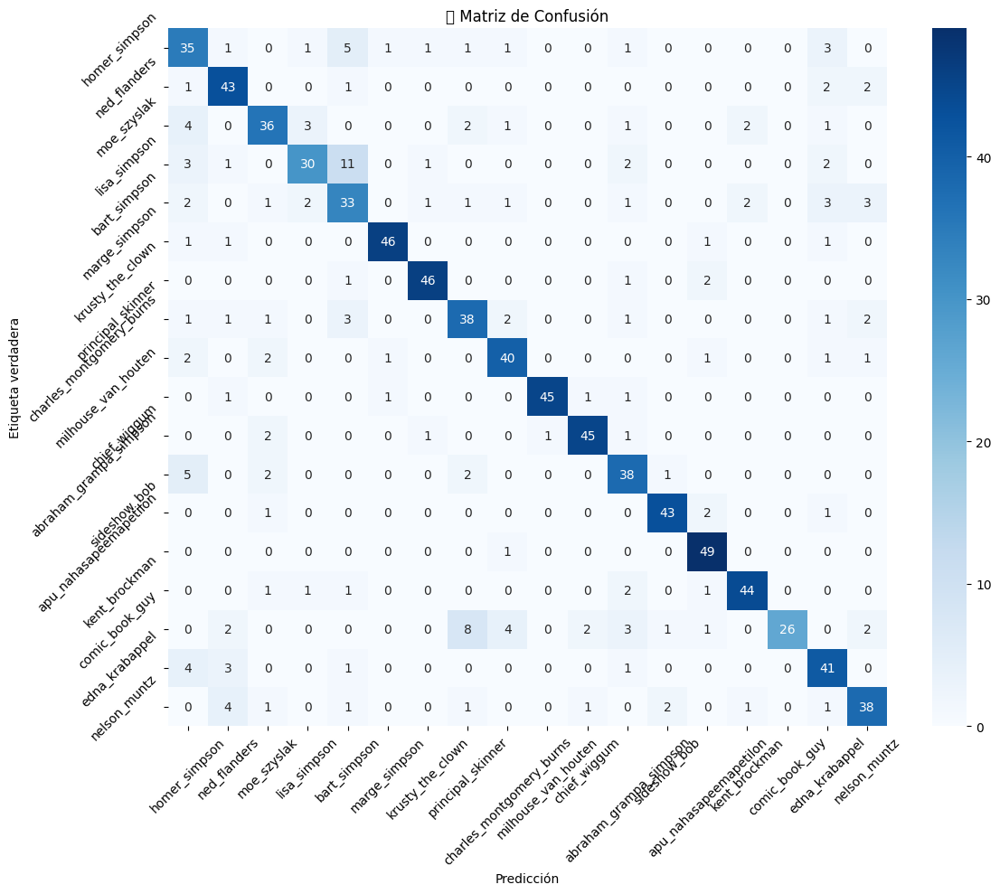

In [95]:
# Nombres de las clases (etiquetas)
class_names = list(test_generator.class_indices.keys())

# Calcular la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualización con seaborn
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicción')
plt.ylabel('Etiqueta verdadera')
plt.title('🔍 Matriz de Confusión')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [96]:
# Mostrar métricas por clase: precisión, recall, F1-score
report = classification_report(y_true, y_pred, target_names=class_names)
print("📋 Classification Report:\n")
print(report)

📋 Classification Report:

                          precision    recall  f1-score   support

           homer_simpson       0.60      0.70      0.65        50
            ned_flanders       0.75      0.88      0.81        49
             moe_szyslak       0.77      0.72      0.74        50
            lisa_simpson       0.81      0.60      0.69        50
            bart_simpson       0.58      0.66      0.62        50
           marge_simpson       0.94      0.92      0.93        50
        krusty_the_clown       0.92      0.92      0.92        50
       principal_skinner       0.72      0.76      0.74        50
charles_montgomery_burns       0.80      0.83      0.82        48
     milhouse_van_houten       0.98      0.92      0.95        49
            chief_wiggum       0.92      0.90      0.91        50
  abraham_grampa_simpson       0.72      0.79      0.75        48
            sideshow_bob       0.91      0.91      0.91        47
  apu_nahasapeemapetilon       0.86      0.98    

In [108]:
# Visualización de métricas de entrenamiento con TensorBoard
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/Deep learning/Logs"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 66982), started 0:09:21 ago. (Use '!kill 66982' to kill it.)

<IPython.core.display.Javascript object>

In [98]:
# Evaluar el modelo directamente sobre el generador de test
loss, accuracy = model.evaluate(test_generator)
print(f"✅ Precisión del modelo en el conjunto de prueba: {accuracy:.4f}")

 3/28 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8264 - loss: 0.8034

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.8044 - loss: 0.8912
✅ Precisión del modelo en el conjunto de prueba: 0.8045


# 🚀7.- Despliegue

In [118]:
# Cargar modelo entrenado
model = tf.keras.models.load_model("/content/drive/MyDrive/Deep learning/Checkpoints/mejor_modelo_resnet.h5")

# Diccionario con los nombres de los personajes
class_indices = train_generator.class_indices  # Asegúrate de que esté definido
idx_to_class = {v: k for k, v in class_indices.items()}

In [120]:
def predecir_personajes_en_video(video_input):
    # Obtener ruta del video

    video_path = None
    if isinstance(video_input, str):
        video_path = video_input
    elif hasattr(video_input, 'name'): # Para archivos subidos en Gradio
        video_path = video_input.name

    if video_path is None or not os.path.exists(video_path):
        return "Error: No se pudo obtener la ruta del video o el archivo no existe."

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        return "Error: No se pudo abrir el video."

    personajes_detectados = []

    frame_count = 0
    inference_img_size = (128, 128)

    # Define cuántos frames saltar. Saltar más frames hace la detección más rápida pero puede perder apariciones cortas.
    frame_skip = 5

    # Usar tqdm para mostrar progreso si es posible
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    print(f"Procesando video: {video_path}")
    print(f"Total de frames: {total_frames}")

    # Inicializar tqdm
    with tqdm(total=total_frames, desc="Procesando frames del video") as pbar:
        while True:
            ret, frame = cap.read()
            if not ret:
                break

            # Procesar cada frame_skip frames
            if frame_count % frame_skip == 0:
                try:
                    # Redimensionar y normalizar la imagen
                    img_resized = cv2.resize(frame, inference_img_size)
                    # Convertir de BGR a RGB si el modelo espera RGB (la mayoría de modelos entrenados con Keras/TF en imágenes)
                    img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
                    img_normalized = img_rgb / 255.0
                    input_array = np.expand_dims(img_normalized, axis=0)

                    # Realizar la predicción
                    pred = model.predict(input_array, verbose=0)[0] # predict returns a batch of predictions, take the first one

                    # Obtener la clase predicha
                    clase_idx = np.argmax(pred)
                    nombre = idx_to_class.get(clase_idx, "Desconocido") # Usar .get para manejar índices no encontrados

                    # Opcional: Añadir un umbral de confianza si solo quieres las predicciones más seguras
                    confidence_threshold = 0.5 # Ejemplo: solo agregar si la confianza es > 50%
                    if pred[clase_idx] > confidence_threshold:
                       personajes_detectados.append(nombre)

                except Exception as e:
                    print(f"Error procesando frame {frame_count}: {e}")
                    # Continuar con el siguiente frame aunque haya un error
                    pass

            frame_count += 1
            pbar.update(1) # Actualiza la barra de progreso

    cap.release()

    if not personajes_detectados:
        return "No se detectaron personajes con confianza suficiente en el video."

    # Contar ocurrencias de personajes
    conteo = Counter(personajes_detectados)

    resultado = "🧠 Personajes detectados en el video (ordenados por frecuencia):\n\n"
    # Ordenar por cantidad descendente
    for personaje, cantidad in conteo.most_common():
        resultado += f"✅ {personaje}: {cantidad} apariciones\n"

    return resultado


In [121]:
# Interfaz Gradio
if 'model' in globals() and 'idx_to_class' in globals():
    interface = gr.Interface(
        fn=predecir_personajes_en_video,
        inputs=gr.Video(label="Sube un video"),
        outputs=gr.Textbox(label="Personajes detectados"),
        title="Detector de Personajes de Los Simpsons",
        description="El modelo analizará el video y mostrará qué personajes detectó, contando las apariciones en los frames procesados.",
        allow_flagging='never' # Desactiva la opción de "Flag" en Gradio
    )
    interface.launch(share=True)
else:
    print("Error: El modelo o el diccionario de clases no están cargados. Asegúrate de ejecutar las secciones anteriores.")

/usr/local/lib/python3.11/dist-packages/gradio/interface.py:416: UserWarning: The `allow_flagging` parameter in `Interface` is deprecated.Use `flagging_mode` instead.
  warnings.warn(


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://5d9ee7a814a5616190.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
